# Code for plots and tables

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Tables

## 100 datasets summary

In [2]:
# Load CSV file containing information about the worst performing datasets
worst_performing_datasets = pd.read_csv('worst_performing_datasets.csv')

# Coompute the mean ROC AUC, PR AUC, length, and number of anomalies for each collection
datasets_summary = worst_performing_datasets.groupby('collection').agg(
    size=('collection', 'size'),
    mean_ROC_AUC=('ROC_AUC', 'mean'),
    mean_PR_AUC=('PR_AUC', 'mean'),
    mean_length=('length', 'mean'),
    mean_num_anomalies=('num_anomalies', 'mean')
).reset_index().sort_values(by='size', ascending=False)

datasets_summary

,collection,size,mean_ROC_AUC,mean_PR_AUC,mean_length,mean_num_anomalies
2,NAB,29,0.562538,0.231513,3333.758621,2.000000
0,GutenTAG,24,0.623401,0.165634,10000.000000,5.375000
6,Self-Generated,20,0.627660,0.100395,10000.000000,2.700000
1,KDD-TSAD,8,0.580809,0.110161,9651.750000,1.000000
3,NASA-MSL,8,0.583565,0.231318,3898.750000,1.375000
4,NASA-SMAP,7,0.554331,0.274292,8177.571429,1.428571
5,NormA,4,0.610870,0.119521,5375.000000,1.500000


# Plots

## AUC-ROC and AUC-PR scores for both pre- and post-parameter fine-tuning

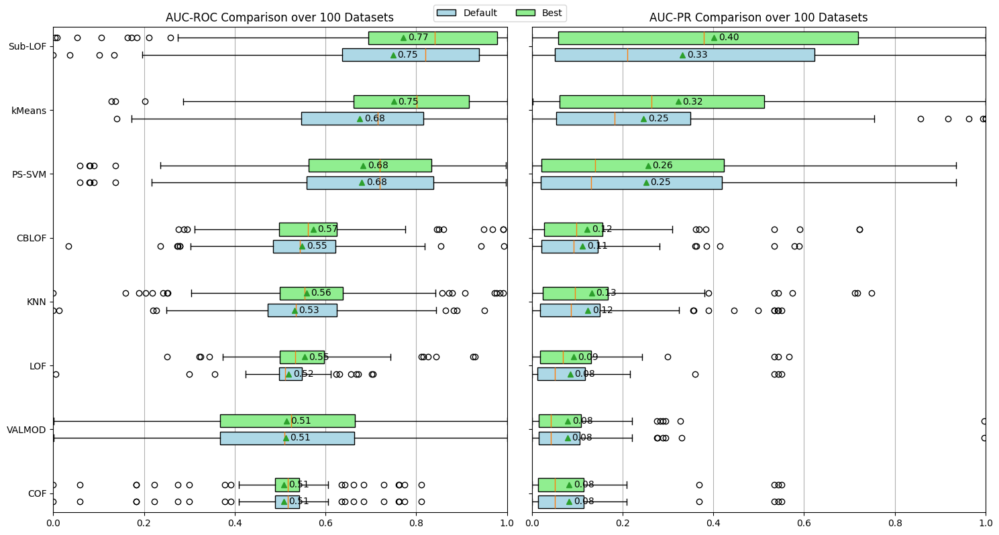

In [9]:
# Generate sample data for 8 algorithms
algorithms = ['COF', 'VALMOD', 'LOF', 'KNN', 'CBLOF', 'PS-SVM', 'kMeans', 'Sub-LOF']

def load_metrics(mode, metric_col):
    data = []
    for algo in algorithms:
        # Load CSV file for each algorithm
        file_path = f"./results/{mode}_{algo}_metrics.csv"
        df = pd.read_csv(file_path)
        data.append(df[metric_col].values)
    return data

# Create figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))

# Plot for AUC-ROC
default_roc = load_metrics('default', 'AUC-ROC')
best_roc = load_metrics('best', 'AUC-ROC')
positions = np.arange(len(algorithms))

# Horizontal boxes for AUC-ROC
bp1_default = ax1.boxplot(default_roc, positions=positions*3-0.4, 
                         vert=False, widths=0.6, patch_artist=True, showmeans=True)
bp1_best = ax1.boxplot(best_roc, positions=positions*3+0.4, 
                       vert=False, widths=0.6, patch_artist=True, showmeans=True)

# Annotate means for AUC-ROC
for i, data in enumerate(default_roc):
    mean_value = np.mean(data)
    ax1.text(mean_value + 0.01, positions[i]*3-0.4, f'{mean_value:.2f}', 
             va='center', ha='left', fontsize=10, color='black')

for i, data in enumerate(best_roc):
    mean_value = np.mean(data)
    ax1.text(mean_value + 0.01, positions[i]*3+0.4, f'{mean_value:.2f}', 
             va='center', ha='left', fontsize=10, color='black')

# Style AUC-ROC plot
ax1.set_title('AUC-ROC Comparison over 100 Datasets')
ax1.set_yticks(positions*3)
ax1.set_yticklabels(algorithms)
ax1.set_xlim(0, 1)
ax1.grid(True, axis='x')

# Color boxes
for box in bp1_default['boxes']:
    box.set(facecolor='lightblue')
for box in bp1_best['boxes']:
    box.set(facecolor='lightgreen')

# Plot for AUC-PR
default_pr = load_metrics('default', 'AUC-PR')
best_pr = load_metrics('best', 'AUC-PR')

# Horizontal boxes for AUC-PR
bp2_default = ax2.boxplot(default_pr, positions=positions*3-0.4, 
                         vert=False, widths=0.6, patch_artist=True, showmeans=True)
bp2_best = ax2.boxplot(best_pr, positions=positions*3+0.4, 
                       vert=False, widths=0.6, patch_artist=True, showmeans=True)

# Annotate means for AUC-PR
for i, data in enumerate(default_pr):
    mean_value = np.mean(data)
    ax2.text(mean_value + 0.01, positions[i]*3-0.4, f'{mean_value:.2f}', 
             va='center', ha='left', fontsize=10, color='black')

for i, data in enumerate(best_pr):
    mean_value = np.mean(data)
    ax2.text(mean_value + 0.01, positions[i]*3+0.4, f'{mean_value:.2f}', 
             va='center', ha='left', fontsize=10, color='black')

# Style AUC-PR plot
ax2.set_title('AUC-PR Comparison over 100 Datasets')
ax2.set_yticks(positions*3)
ax2.set_yticklabels([])
ax2.set_xlim(0, 1)
ax2.grid(True, axis='x')

# Color boxes
for box in bp2_default['boxes']:
    box.set(facecolor='lightblue')
for box in bp2_best['boxes']:
    box.set(facecolor='lightgreen')

# Add legend
fig.legend([bp1_default["boxes"][0], bp1_best["boxes"][0]], 
          ['Default', 'Best'], loc='upper center', ncol=2)

plt.tight_layout()
plt.show()


## Comparison of AUC-ROC \& AUC-PR scores across 100 datasets, highlighting the performance gains of ensemble methods (distance-based and cross-family) over individual Sub-LOF configurations (default and tuned)

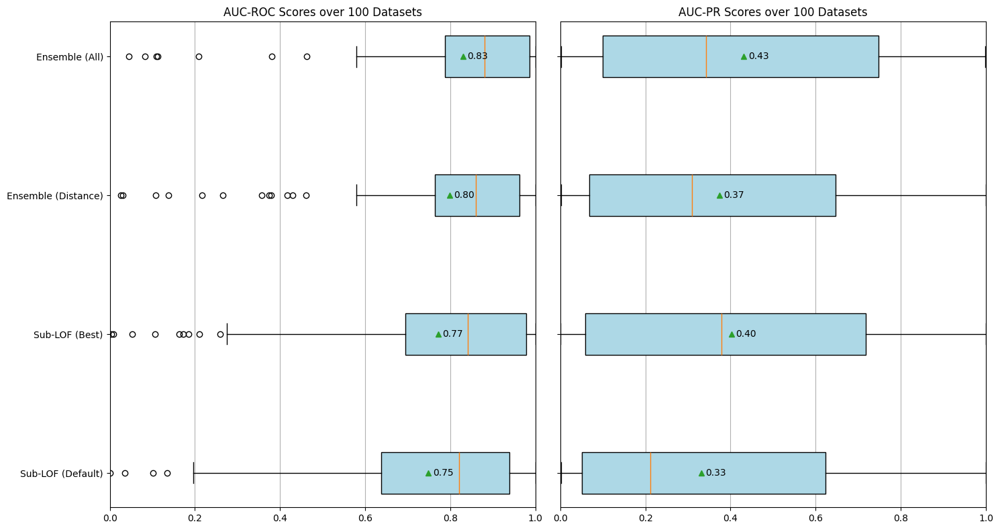

In [8]:
files = {'Sub-LOF (Default)': 'results/default_sub-lof_metrics.csv',
         'Sub-LOF (Best)': 'results/best_sub-lof_metrics.csv',
         'Ensemble (Distance)': 'results/best_algorithm_combination_distance_metrics.csv',
         'Ensemble (All)': 'results/best_algorithm_combination_all_metrics.csv'}

# Create figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))

# Load and plot data
positions = np.arange(len(files))
labels = list(files.keys())

for i, (label, file_path) in enumerate(files.items()):
    # Read data
    df = pd.read_csv(file_path)
    
    # Calculate means
    mean_auc_roc = df['AUC-ROC'].mean()
    mean_auc_pr = df['AUC-PR'].mean()
    
    # Plot AUC-ROC
    ax1.boxplot(df['AUC-ROC'].values, positions=[i*2], 
                vert=False, widths=0.6, patch_artist=True,
                boxprops=dict(facecolor='lightblue'), showmeans=True)
    # Annotate mean AUC-ROC
    ax1.text(mean_auc_roc + 0.01, i*2, f'{mean_auc_roc:.2f}', 
             va='center', ha='left', fontsize=10, color='black')
    
    # Plot AUC-PR
    ax2.boxplot(df['AUC-PR'].values, positions=[i*2], 
                vert=False, widths=0.6, patch_artist=True,
                boxprops=dict(facecolor='lightblue'), showmeans=True)
    # Annotate mean AUC-PR
    ax2.text(mean_auc_pr + 0.01, i*2, f'{mean_auc_pr:.2f}', 
             va='center', ha='left', fontsize=10, color='black')

# Style AUC-ROC plot
ax1.set_title('AUC-ROC Scores over 100 Datasets')
ax1.set_yticks(positions*2)
ax1.set_yticklabels(labels)
ax1.set_xlim(0, 1)
ax1.grid(True, axis='x')

# Style AUC-PR plot
ax2.set_title('AUC-PR Scores over 100 Datasets')
ax2.set_yticks(positions*2)
ax2.set_yticklabels([])
ax2.set_xlim(0, 1)
ax2.grid(True, axis='x')

plt.tight_layout()
plt.show()

In [5]:
def plot_dataset(file_path):
    # Load anomaly scores
    scores_files = {
        'Algorithm Combination (All)': 'results/best_algorithm_combination_all_scores.npz',
        'Sub-LOF': 'results/best_sub-lof_scores.npz',
        'GrammarViz3': 'results/default_grammarviz3_scores.npz',
        'DWT-MLEAD': 'results/default_dwt-mlead_scores.npz'
    }
    
    METHOD_COLORS = {
        'Ensemble (All)': 'blue',
        'Sub-LOF': 'green',
        'GrammarViz3': 'red',
        'DWT-MLEAD': 'purple'
    }
    
    # Load the dataset
    data = pd.read_csv(file_path)

    # Create figure
    plt.figure(figsize=(12, 8))
    
    # Subplot 1: Test time series
    plt.subplot(2, 1, 1)
    x_values = np.arange(len(data))
    
    # Plot each time series column
    for col in data.iloc[:, 1:-1].columns:
        plt.plot(x_values, data[col], label=f"{col}")
    
    # Highlight anomaly regions
    anomaly_mask = data.iloc[:, -1] == 1
    anomaly_regions = data[anomaly_mask].index
    
    if not anomaly_regions.empty:
        start = None
        for i in range(len(anomaly_regions)):
            if start is None:
                start = anomaly_regions[i]
            if i == len(anomaly_regions) - 1 or anomaly_regions[i + 1] != anomaly_regions[i] + 1:
                end = anomaly_regions[i]
                plt.axvspan(start, end, color="red", alpha=0.3,
                           label="Anomaly" if start == anomaly_regions[0] else "")
                start = None
    
    plt.title(f"Test Time Series - {file_path}")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend()
    
    # Subplot 2: Anomaly scores
    plt.subplot(2, 1, 2)
    
    # Load and plot anomaly scores for each method
    for algo_name, score_file in scores_files.items():
        scores = np.load(score_file)[file_path]
        min_val, max_val = np.min(scores), np.max(scores)
        scores = np.zeros_like(scores) if min_val == max_val else (scores - min_val) / (max_val - min_val)
        plt.plot(x_values, scores, label=algo_name,
                 color=METHOD_COLORS[algo_name])
    
    plt.title("Anomaly Scores")
    plt.xlabel("Time")
    plt.ylabel("Score")
    plt.legend()
    
    plt.tight_layout()
    
    plt.show()

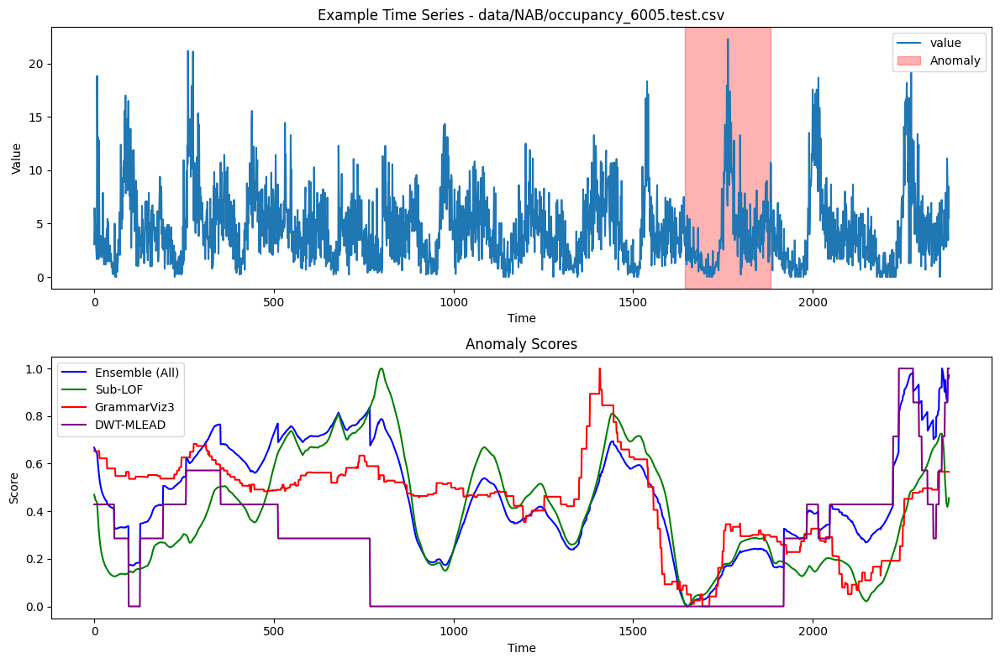

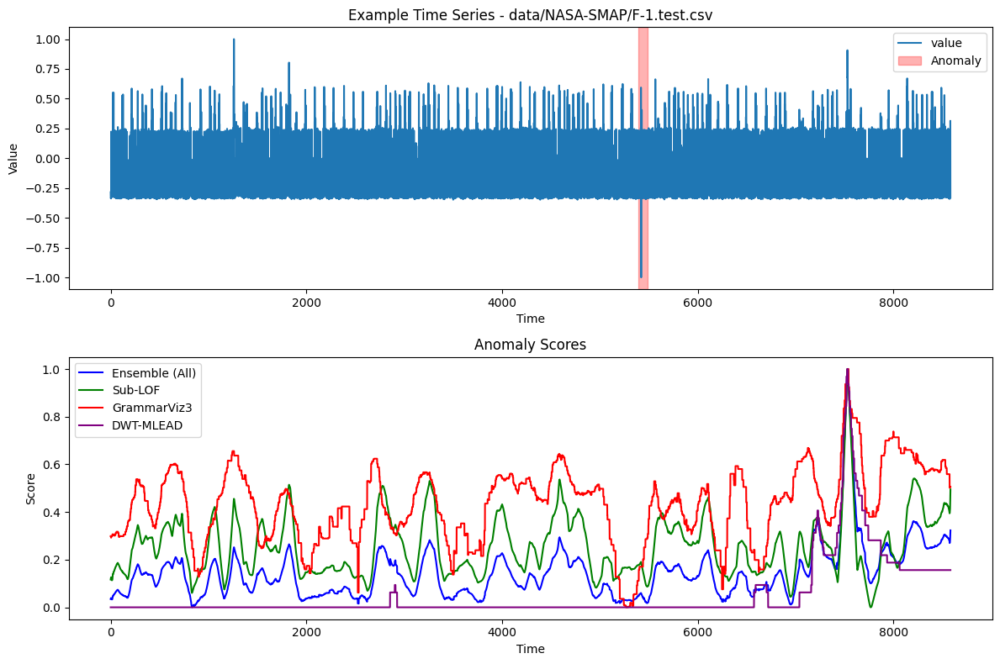

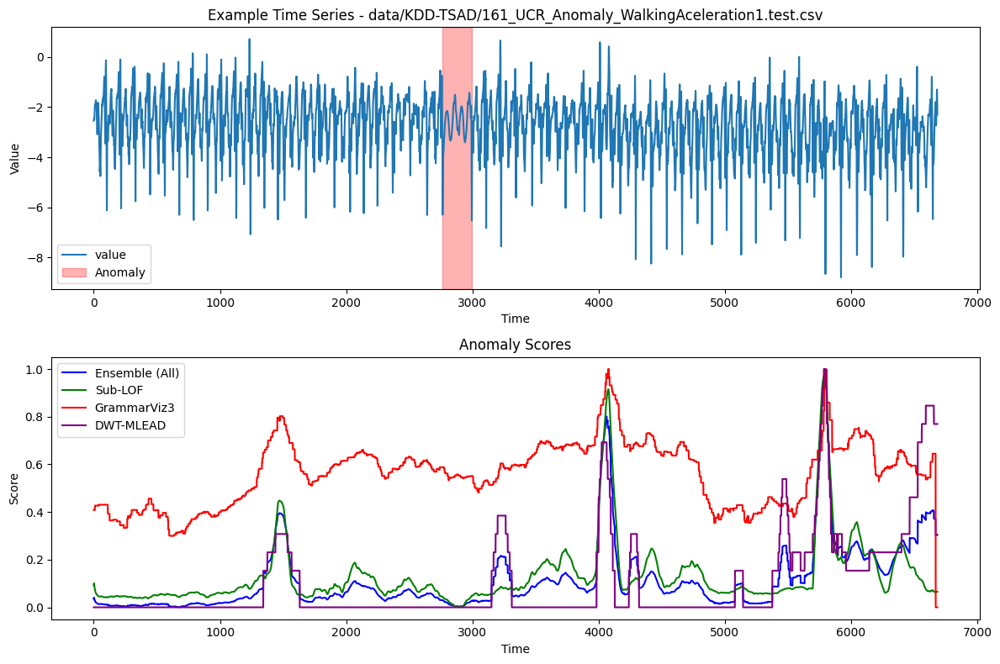

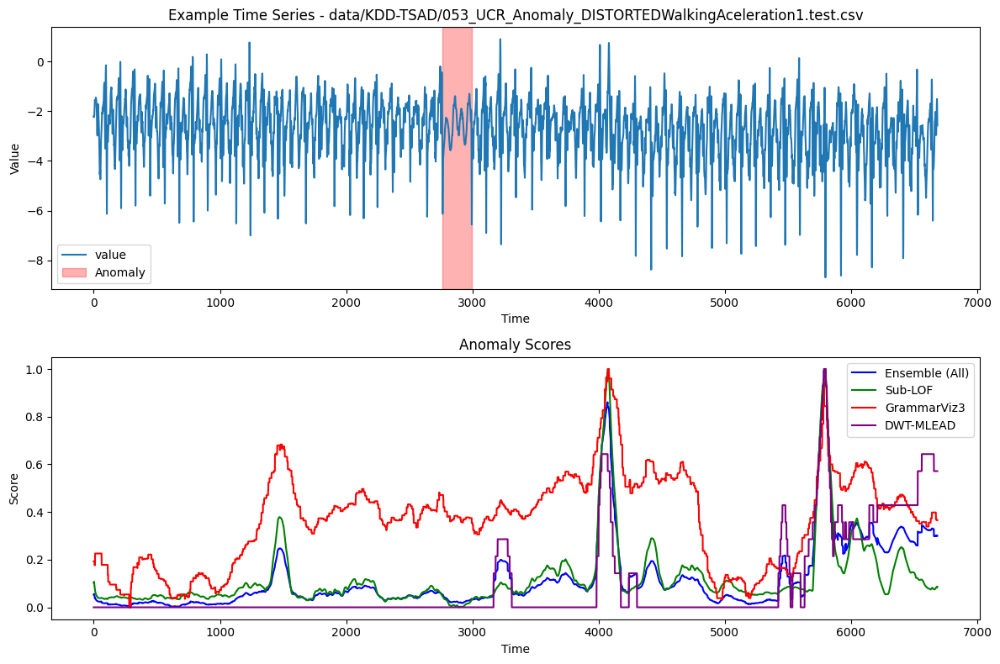

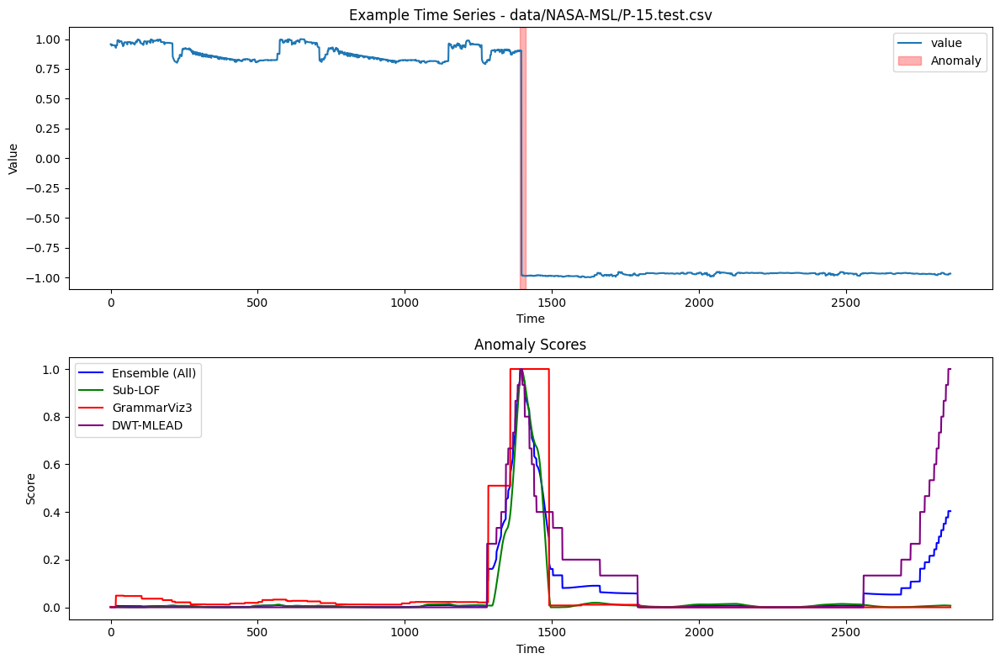

...

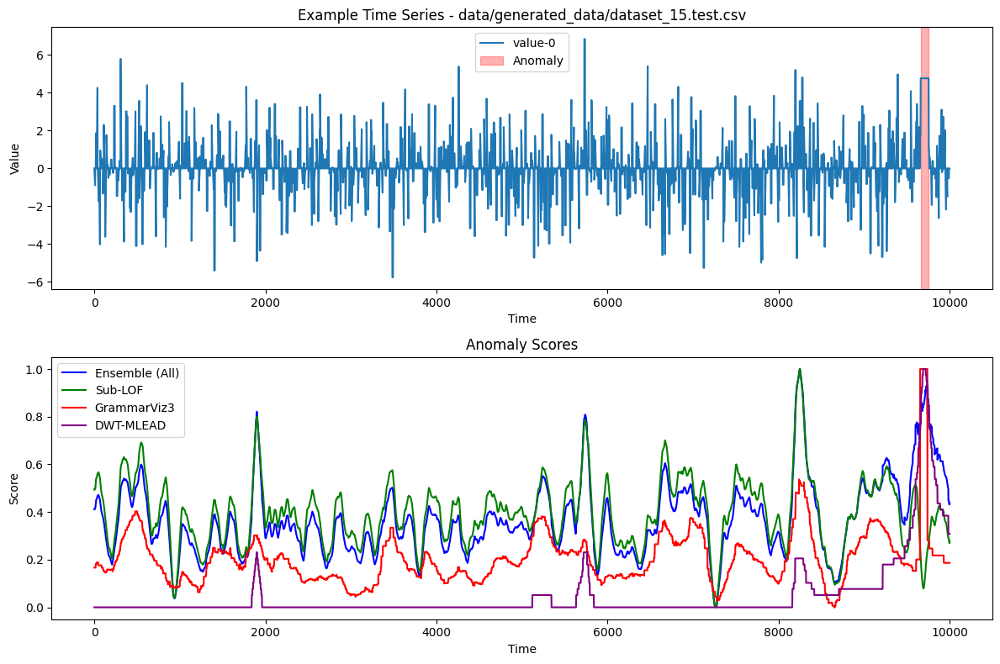

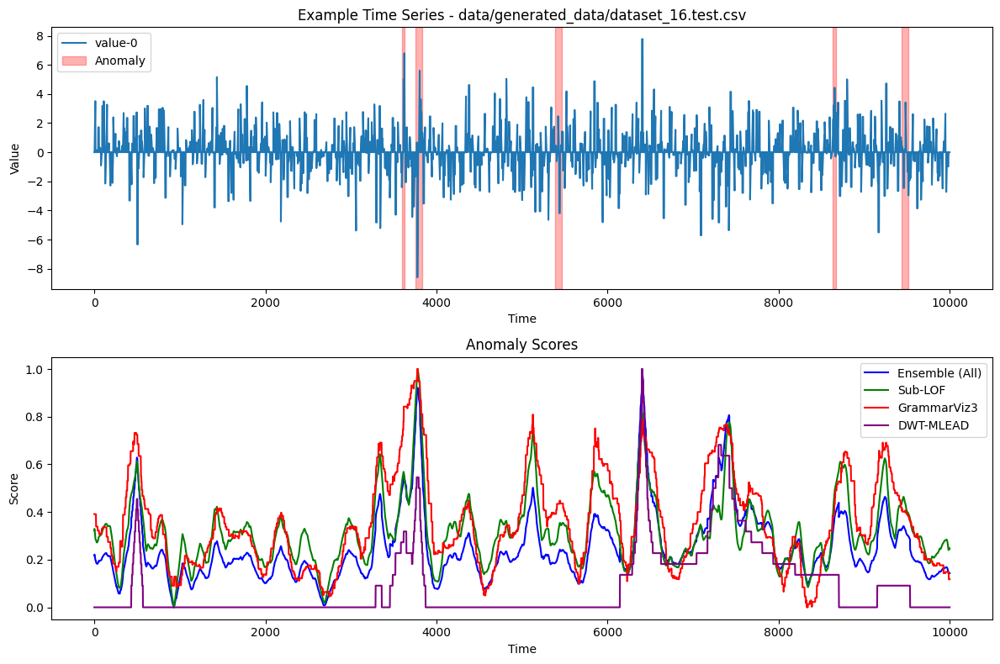

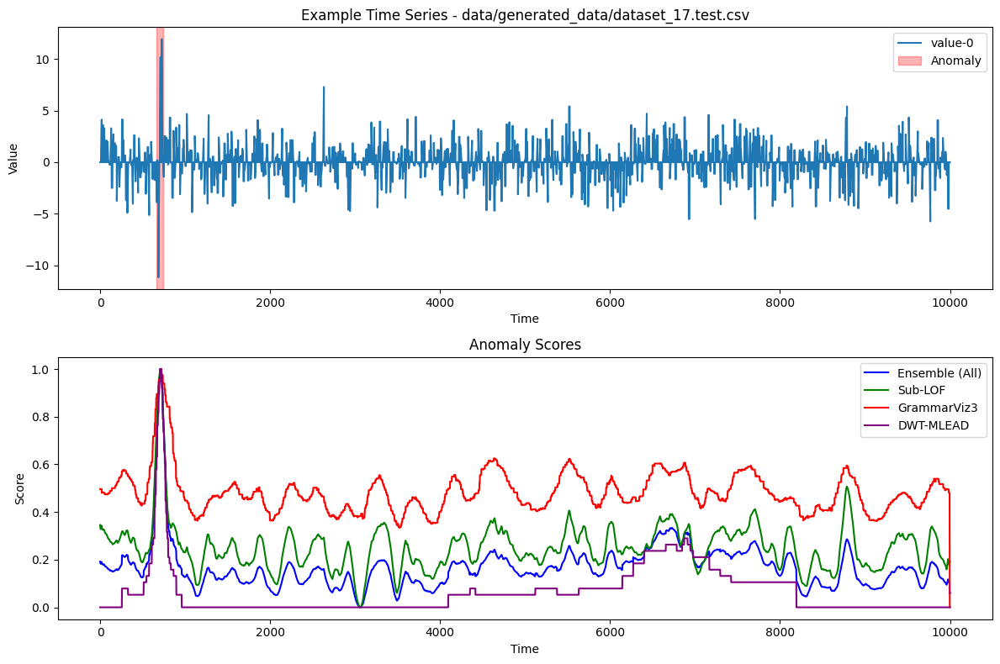

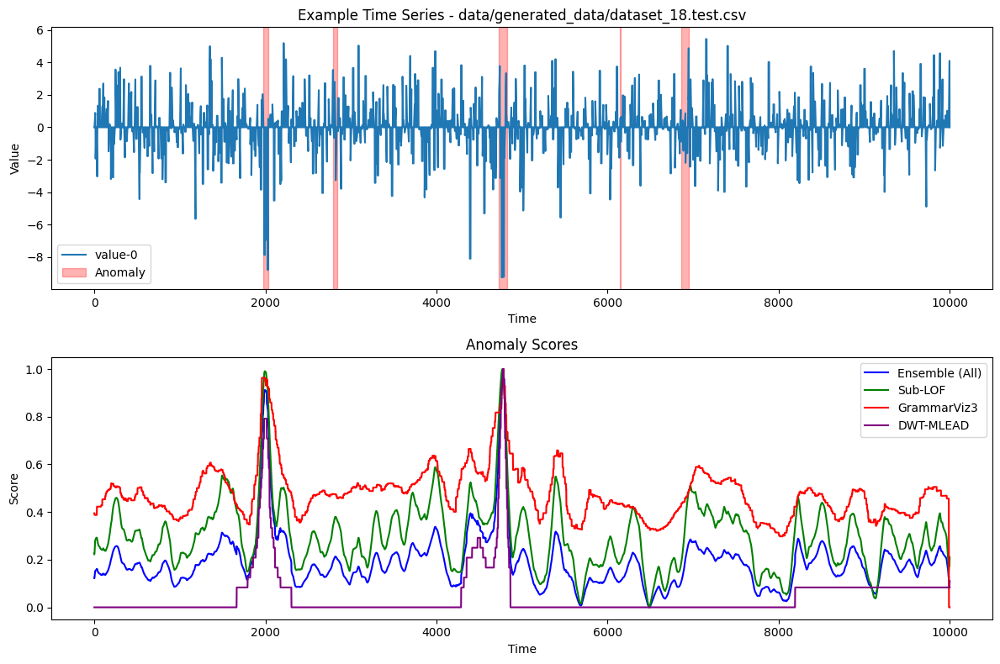

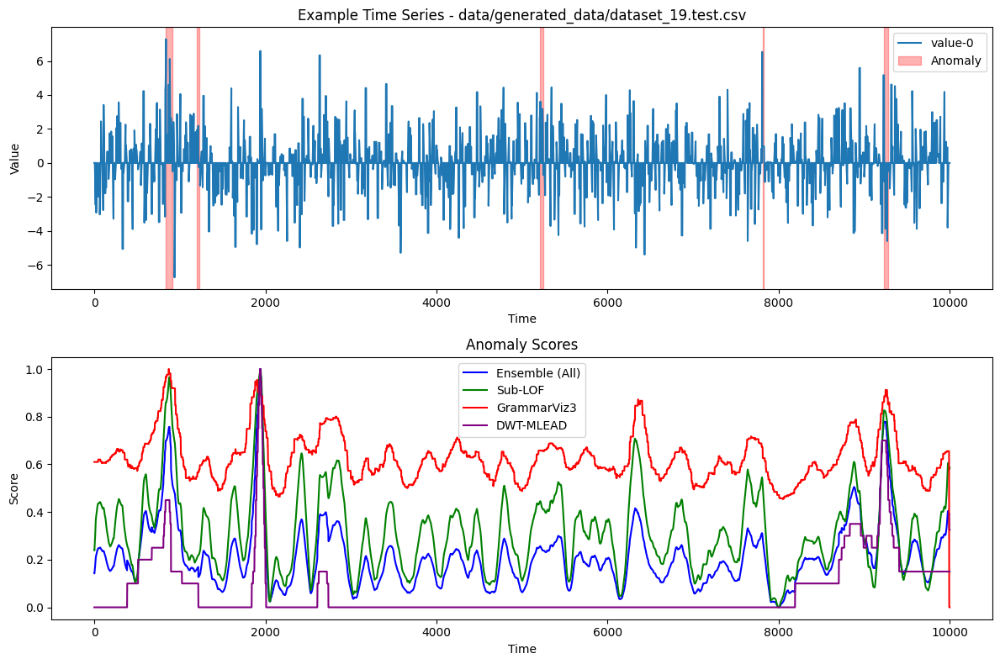

In [6]:
for file_path in worst_performing_datasets['file_path']:
    plot_dataset(file_path)